In [73]:
# To enable plotting graphs in Jupyter notebook
%matplotlib inline
import pandas as pd
from sklearn.linear_model import LogisticRegression

# importing ploting libraries
import matplotlib.pyplot as plt   

#importing seaborn for statistical plots
import seaborn as sns

from sklearn import preprocessing

from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
import numpy as np
import os,sys
from sklearn.metrics import classification_report, confusion_matrix

# calculate accuracy measures and confusion matrix
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from os import system
from IPython.display import Image
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score


In [33]:
df_vehicle=pd.read_csv('Part3 - vehicle.csv')

In [34]:
copy_df = df_vehicle

In [35]:
copy_df.shape

(846, 19)

In [36]:
dupes = copy_df.duplicated()
sum(dupes)

0

In [41]:
copy_df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [42]:
copy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr_axis_aspect_ratio         844 non-null    float64
 5   max_length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr_axis_rectangularity       843 non-null    float64
 9   max_length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance_1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [43]:
copy_df.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr_axis_aspect_ratio           2
max_length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr_axis_rectangularity         3
max_length_rectangularity      0
scaled_variance                3
scaled_variance_1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration_1    4
skewness_about                 6
skewness_about_1               1
skewness_about_2               1
hollows_ratio                  0
class                          0
dtype: int64

There are missing values in the data. All these missing values will be replaced by mean of their respective column. In this case, for circularity, distance_circularity, radius_ratio,pr.axis_aspect_ratio, scatter_ratio, elongatedness                      

In [44]:
copy_df.columns=['compactness','circularity','distance_circularity','radius_ratio','pr_axis_aspect_ratio','max_length_aspect_ratio','scatter_ratio','elongatedness','pr_axis_rectangularity','max_length_rectangularity','scaled_variance','scaled_variance_1','scaled_radius_of_gyration','scaled_radius_of_gyration_1', 'skewness_about','skewness_about_1','skewness_about_2','hollows_ratio','class']                          

In [45]:
# Replace NaN values with the mean of the column
copy_df['circularity'].fillna(copy_df.circularity.median(), inplace = True) 
copy_df['distance_circularity'].fillna(copy_df.distance_circularity.median(), inplace = True) 
copy_df['radius_ratio'].fillna(copy_df.radius_ratio.median(), inplace = True) 
copy_df['pr_axis_aspect_ratio'].fillna(copy_df.pr_axis_aspect_ratio.median(), inplace = True) 
copy_df['scatter_ratio'].fillna(copy_df.scatter_ratio.median(), inplace = True) 
copy_df['elongatedness'].fillna(copy_df.elongatedness.median(), inplace = True) 
copy_df['pr_axis_rectangularity'].fillna(copy_df.pr_axis_rectangularity.median(), inplace = True) 
copy_df['scaled_variance'].fillna(copy_df.scaled_variance.median(), inplace = True) 
copy_df['scaled_variance_1'].fillna(copy_df.scaled_variance_1.median(), inplace = True) 
copy_df['scaled_radius_of_gyration'].fillna(copy_df.scaled_radius_of_gyration.median(), inplace = True) 
copy_df['scaled_radius_of_gyration_1'].fillna(copy_df.scaled_radius_of_gyration_1.median(), inplace = True) 
copy_df['skewness_about'].fillna(copy_df.skewness_about.median(), inplace = True) 
copy_df['skewness_about_1'].fillna(copy_df.skewness_about_1.median(), inplace = True) 
copy_df['skewness_about_2'].fillna(copy_df.skewness_about_2.median(), inplace = True) 

In [46]:
copy_df.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr_axis_aspect_ratio           0
max_length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr_axis_rectangularity         0
max_length_rectangularity      0
scaled_variance                0
scaled_variance_1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration_1    0
skewness_about                 0
skewness_about_1               0
skewness_about_2               0
hollows_ratio                  0
class                          0
dtype: int64

In [47]:
copy_df.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.823877,82.100473,168.874704,61.677305,8.567376,168.887707,40.936170,20.580378,147.998818,188.596927,439.314421,174.706856,72.443262,6.361702,12.600473,188.918440,195.632388
std,8.234474,6.134272,15.741569,33.401356,7.882188,4.601217,33.197710,7.811882,2.588558,14.515652,31.360427,176.496341,32.546277,7.468734,4.903244,8.930962,6.152247,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.250000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,586.750000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


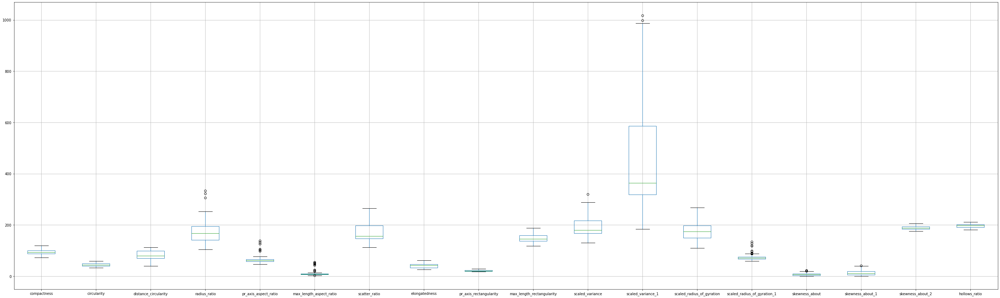

In [48]:
copy_df.boxplot(figsize=(50,15))

From the box plot it can be observed that the radius ratio, Pr_axis_aspect_ratio, scatter varience, scaled_radius_of_gyration_1, skewness_about , skewness_about_1 all have outliers. 

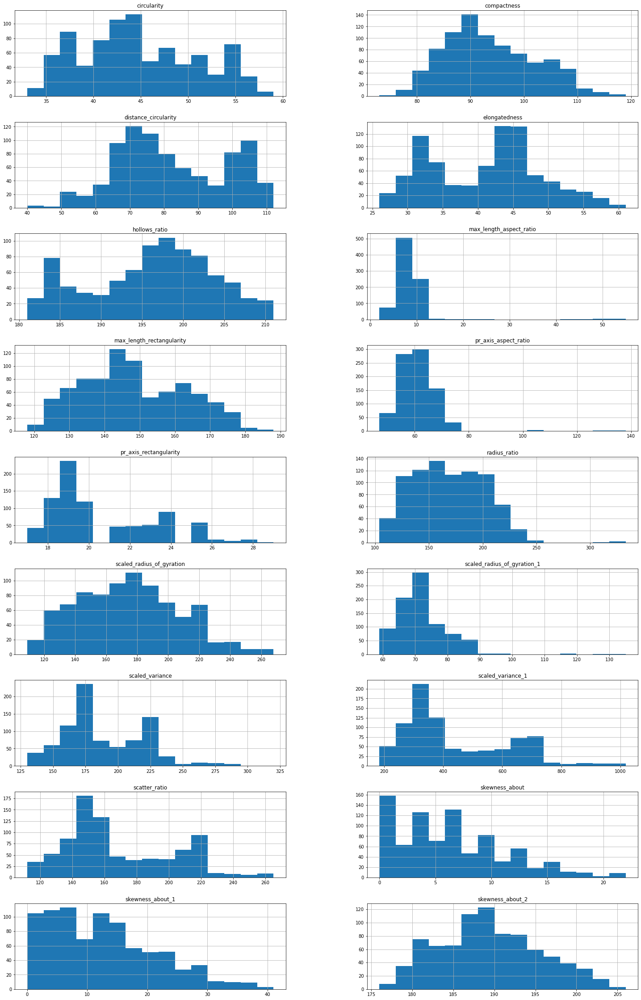

In [49]:
columns = list(copy_df)[0:-1] # Excluding Outcome column which has only 
copy_df[columns].hist(stacked=False, bins=15, figsize=(25,100), layout=(22,2)); 

In [50]:
#find the outliers and replace them by median
for col_name in copy_df.columns[:-1]:
    q1 = copy_df[col_name].quantile(0.25)
    q3 = copy_df[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    
    copy_df.loc[(copy_df[col_name] < low) | (copy_df[col_name] > high), col_name] = copy_df[col_name].median()

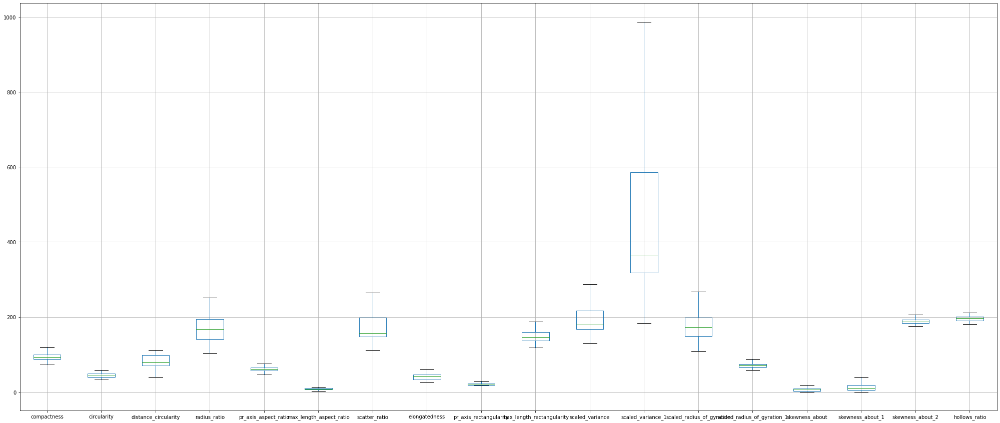

In [21]:
# again check for outliers in dataset using boxplot
copy_df.boxplot(figsize=(35,15))

In [51]:
#univariate analysis
copy_df['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

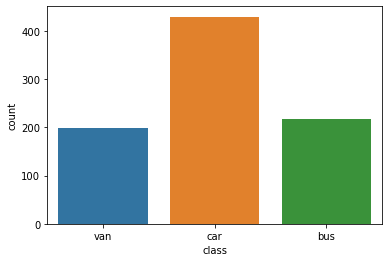

In [52]:
sns.countplot(x="class", data=copy_df)

In [53]:
copy_df.groupby(["class"]).mean()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,91.591743,44.963303,76.811927,165.720183,62.912844,6.431193,170.022936,40.114679,20.577982,146.701835,192.889908,442.981651,180.963303,76.295872,4.816514,10.211009,187.811927,191.325688
car,96.184149,46.030303,88.878788,180.496503,60.993007,8.825175,180.997669,38.104895,21.508159,149.967366,197.806527,499.904429,179.613054,69.935897,6.699301,15.090909,189.470862,197.582751
van,90.562814,42.070352,73.281407,144.964824,59.577889,8.442211,141.537688,47.939698,18.582915,145.175879,163.331658,298.201005,157.276382,71.505025,6.417085,9.698492,188.939698,196.145729


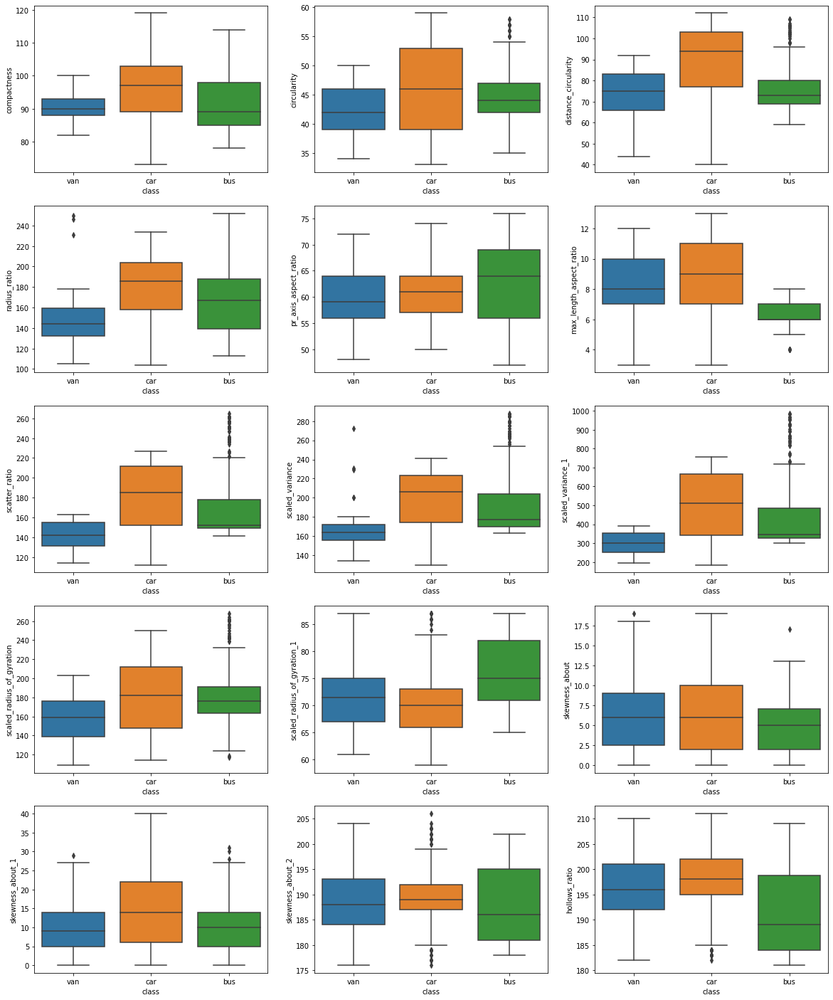

In [54]:
%matplotlib inline
from matplotlib import pyplot as plt
fig, ax = plt.subplots(5, 3)
fig.set_figheight(25)
fig.set_figwidth(20)
sns.boxplot(y="compactness", x="class", data=copy_df,ax=ax[0,0])
sns.boxplot(y="circularity", x="class", data=copy_df,ax=ax[0,1])
sns.boxplot(y="distance_circularity", x="class", data=copy_df,ax=ax[0,2])
sns.boxplot(y="radius_ratio", x="class", data=copy_df,ax=ax[1,0])
sns.boxplot(y="pr_axis_aspect_ratio", x="class", data=copy_df,ax=ax[1,1])
sns.boxplot(y="max_length_aspect_ratio", x="class", data=copy_df,ax=ax[1,2])
sns.boxplot(y="scatter_ratio", x="class", data=copy_df,ax=ax[2,0])
sns.boxplot(y="scaled_variance", x="class", data=copy_df,ax=ax[2,1])
sns.boxplot(y="scaled_variance_1", x="class", data=copy_df, ax=ax[2,2])
sns.boxplot(y="scaled_radius_of_gyration", x="class", data=copy_df,ax=ax[3,0])
sns.boxplot(y="scaled_radius_of_gyration_1", x="class", data=copy_df,ax=ax[3,1])
sns.boxplot(y="skewness_about", x="class", data=copy_df,ax=ax[3,2])
sns.boxplot(y="skewness_about_1", x="class", data=copy_df,ax=ax[4,0])
sns.boxplot(y="skewness_about_2", x="class", data=copy_df,ax=ax[4,1])
sns.boxplot(y="hollows_ratio", x="class", data=copy_df,ax=ax[4,2])


In [55]:
#Encoding of categorical variables
from sklearn.preprocessing import LabelEncoder   # import label encoder
labelencoder_X=LabelEncoder()
copy_df['class']=labelencoder_X.fit_transform(copy_df['class'])

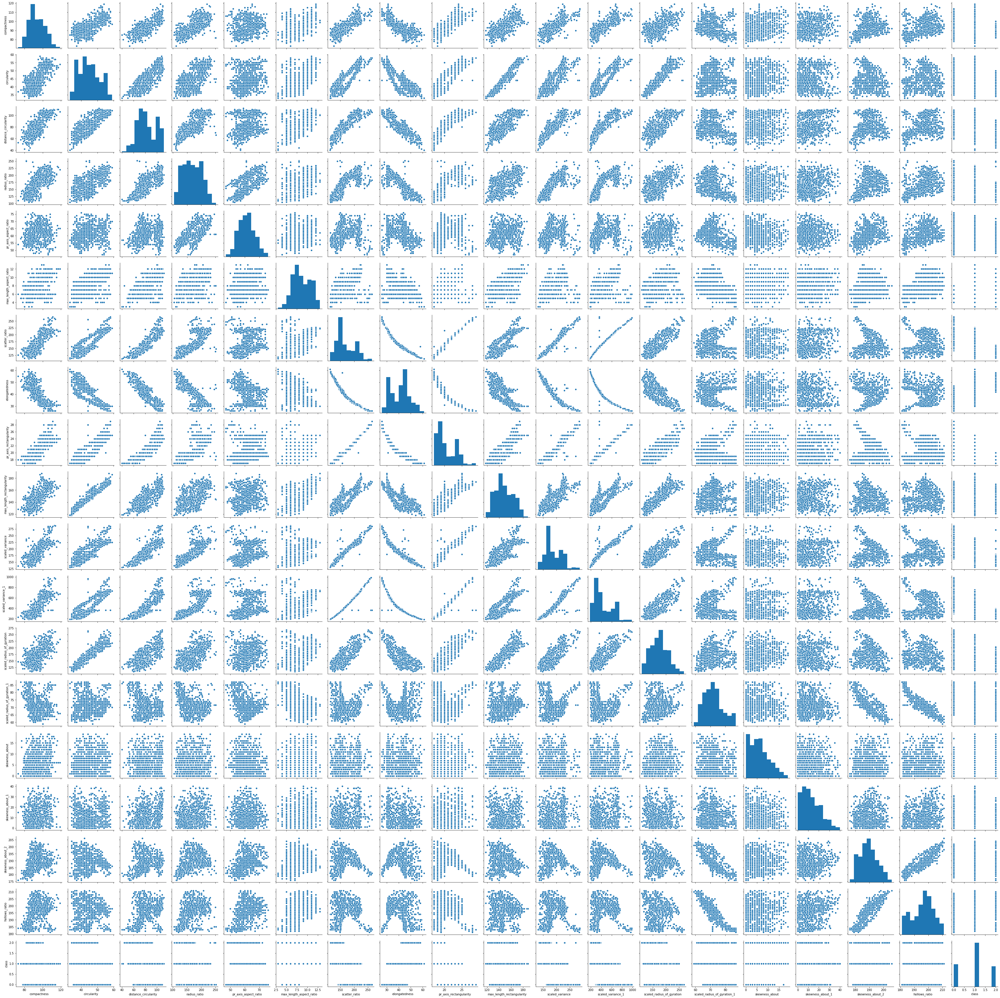

In [56]:
sns.pairplot(copy_df)

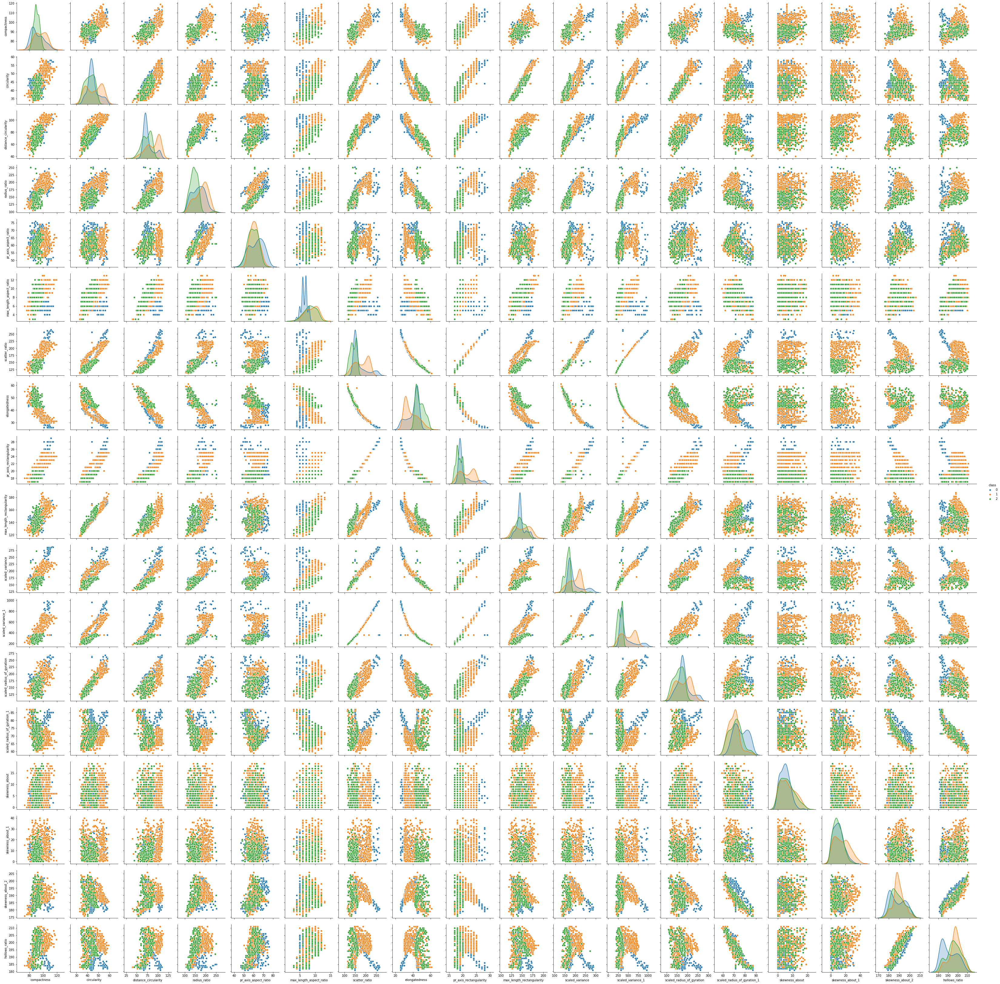

In [57]:
sns.pairplot(copy_df, hue='class')

In [58]:
def plot_corr(copy_df, size=11):
    corr = df.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)
    

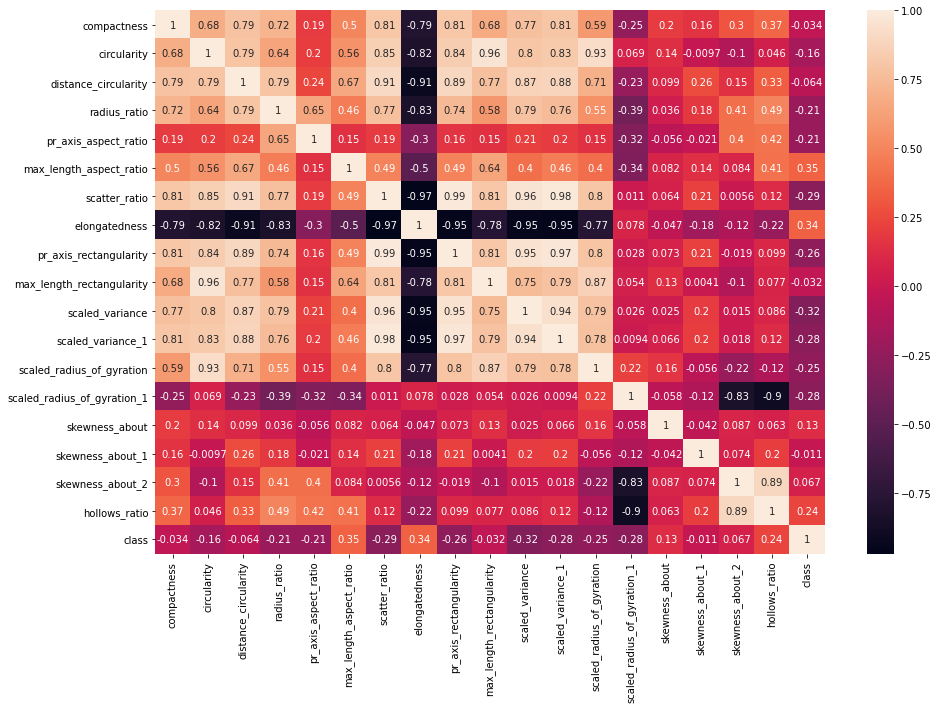

In [59]:
plt.figure(figsize = (15,10))
sns.heatmap(copy_df.corr(), annot = True )
#plot_corr(cr_df)

There seems to be lot of correlation between the variables,scatter ratio and pr_axis_rectangularity and scaled variance_1, elongatedness. One of them can be dropped out because of their high colinarity.   

Spliting data for SVM

In [78]:
X = (copy_df.drop(['class'], 1))
y = ((copy_df['class']))

In [64]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=10)

In [74]:
# scaling the data using the standard scaler
#from sklearn.preprocessing import StandardScaler
#X_train_sd = StandardScaler().fit_transform(X_train)
#X_test_sd = StandardScaler().fit_transform(X_test)

In [79]:
# lets create a copy of the train and test data for scaling
X_Train_stand = X_train.copy()
X_Test_stand = X_test.copy()

Scaling the data

In [80]:
# we will use standard scaler for scaling the data.
scale = StandardScaler().fit(X_Train_stand)

In [81]:
X_train= scale.transform(X_Train_stand)
X_test= scale.transform(X_Test_stand)

In [82]:
X_train

array([[ 0.28403568,  0.0342769 ,  0.31789684, ..., -0.51436916,
         0.50759063,  0.72107511],
       [ 1.59997915,  1.18461941,  1.33486587, ..., -0.85909509,
         0.01482194,  0.31833749],
       [-1.15153903, -0.95173096,  0.50857854, ...,  2.93289014,
         0.17907817,  0.31833749],
       ...,
       [ 1.8392416 ,  0.69161548,  1.33486587, ...,  0.9794432 ,
         0.50759063,  0.72107511],
       [-0.43375168,  0.19861154, -0.1270271 , ..., -0.62927781,
        -0.64220298, -0.3528919 ],
       [-1.63006393,  0.0342769 , -0.69907218, ...,  0.40489998,
        -1.2992279 , -1.15836716]])

In [83]:
if (pd.DataFrame(X_train).isnull().sum().any()==0):
    print('There are no null values in the training datset')
else:
    print('There are null values in the training datset')

if (pd.DataFrame(X_test).isnull().sum().any()==0):
    print('There are no null values in the test datset')
else:
    print('There are null values in the test datset')

There are no null values in the training datset
There are no null values in the test datset


In [85]:
#Logistic_regression:
model = LogisticRegression()
model.fit(X_train, y_train)
prediction = model.predict(X_test)

In [86]:
# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ',model.score(X_test , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.9452662721893491
Accuracy on Testing data:  0.9411764705882353
Recall value:  0.948188995941805
Precision value:  0.9259484747500641
Confusion Matrix:
 [[43  3  1]
 [ 0 82  1]
 [ 1  4 35]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.91      0.95        47
           1       0.92      0.99      0.95        83
           2       0.95      0.88      0.91        40

    accuracy                           0.94       170
   macro avg       0.95      0.93      0.94       170
weighted avg       0.94      0.94      0.94       170



In [93]:
resultsDf=pd.DataFrame({'Model':['Logistic'],'Accuracy': model.score(X_test , y_test)},index={'1'})
resultsDf=resultsDf[['Model','Accuracy']]
resultsDf

,Model,Accuracy
1,Logistic,0.623529


In [87]:
#Naive Bayes
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_train, y_train)
prediction = model.predict(X_test)

In [90]:
# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))


Accuracy on Training data:  0.6242603550295858
Accuracy on Testing data:  0.6235294117647059
Recall value:  0.6415560095335376
Precision value:  0.7241851285968933
Confusion Matrix:
 [[13  1  0]
 [12 56  0]
 [19 32 37]]
Classification Report:
               precision    recall  f1-score   support

           0       0.30      0.93      0.45        14
           1       0.63      0.82      0.71        68
           2       1.00      0.42      0.59        88

    accuracy                           0.62       170
   macro avg       0.64      0.72      0.58       170
weighted avg       0.79      0.62      0.63       170



In [94]:
#Store the accuracy results for each kernel in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Model':['Naive Bayes'], 'Accuracy': model.score(X_test, y_test)},index={'2'})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Model','Accuracy']]
resultsDf

,Model,Accuracy
1,Logistic,0.623529
2,Naive Bayes,0.623529


In [91]:
#SVM
from sklearn.svm import SVC
clf = SVC()
clf.fit(X_train, y_train)
prediction = model.predict(X_test)

In [92]:
# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.6242603550295858
Accuracy on Testing data:  0.6235294117647059
Recall value:  0.6415560095335376
Precision value:  0.7241851285968933
Confusion Matrix:
 [[13  1  0]
 [12 56  0]
 [19 32 37]]
Classification Report:
               precision    recall  f1-score   support

           0       0.30      0.93      0.45        14
           1       0.63      0.82      0.71        68
           2       1.00      0.42      0.59        88

    accuracy                           0.62       170
   macro avg       0.64      0.72      0.58       170
weighted avg       0.79      0.62      0.63       170



In [95]:
#Store the accuracy results for each kernel in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Model':['SVM'], 'Accuracy': model.score(X_test, y_test)},index={'3'})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Model','Accuracy']]
resultsDf

,Model,Accuracy
1,Logistic,0.623529
2,Naive Bayes,0.623529
3,SVM,0.623529


Without PCA it can be seen that logistic regression had the best accuracy.

Dimensional reduction

In [98]:
# Scaling the independent attributes using zscore
from scipy.stats import zscore
X_z=X.apply(zscore)
X_z.shape

(846, 18)

In [99]:
# generating the covariance matrix and the eigen values for the PCA analysis
cov_matrix = np.cov(X_z.T) # the relevanat covariance matrix
print('Covariance Matrix \n%s', cov_matrix)


Covariance Matrix 
%s [[ 1.00118343  0.68569786  0.79086299  0.72277977  0.1930925   0.50051942
   0.81358214 -0.78968322  0.81465658  0.67694334  0.77078163  0.80712401
   0.58593517 -0.24697246  0.19754181  0.1565327   0.29889034  0.36598446]
 [ 0.68569786  1.00118343  0.79325751  0.63903532  0.20349327  0.5611334
   0.8489411  -0.82244387  0.84439802  0.96245572  0.80371846  0.82844154
   0.92691166  0.06882659  0.13651201 -0.00967793 -0.10455005  0.04640562]
 [ 0.79086299  0.79325751  1.00118343  0.79516215  0.24462154  0.66759792
   0.90614687 -0.9123854   0.89408198  0.77544391  0.87061349  0.88498924
   0.70660663 -0.22962442  0.09922417  0.26265581  0.14627113  0.33312625]
 [ 0.72277977  0.63903532  0.79516215  1.00118343  0.65132393  0.46450748
   0.77085211 -0.82636872  0.74502008  0.58015378  0.78711387  0.76115704
   0.55142559 -0.39092105  0.03579728  0.17981316  0.40632957  0.49234013]
 [ 0.1930925   0.20349327  0.24462154  0.65132393  1.00118343  0.15047265
   0.19442484

In [100]:
#Finding eigenvalues amd eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[-2.72502890e-01 -8.70435783e-02  3.81852075e-02  1.38675013e-01
  -1.37101466e-01  2.63611383e-01  2.02717114e-01 -7.58796410e-01
   3.66685918e-01  1.60045219e-01  8.40252779e-02  2.14645175e-02
  -1.87350749e-02  6.89082276e-02  4.26105276e-02  9.97784975e-02
  -8.22590084e-02 -3.30366937e-02]
 [-2.87254690e-01  1.31621757e-01  2.01146908e-01 -3.80554832e-02
   1.38995553e-01 -7.13474241e-02 -3.92275358e-01 -6.76034223e-02
   5.53261885e-02 -1.82323962e-01 -3.65229874e-02  1.47247511e-01
  -4.89102355e-02  5.90534770e-02 -6.74107885e-01  1.63466948e-01
  -2.59100771e-01  2.48832011e-01]
 [-3.02421105e-01 -4.61430061e-02 -6.34621085e-02  1.08954287e-01
   8.00174278e-02 -1.69006151e-02  1.63371282e-01  2.77371950e-01
   7.46784853e-02  2.73033778e-01  4.68505530e-01  6.52730855e-01
   4.74162132e-03 -1.62108150e-01 -4.99754439e-04 -6.36582307e-02
   1.20629778e-01  9.80561531e-02]
 [-2.69713545e-01 -1.97931263e-01 -5.62851689e-02 -2.54355087e-01
  -1.33744367e-01 -

Eigenvectors are the new dimensions of the new mathematical space.
Eigenvalues are the information content of each one of these eigenvectors or we can say it is the spread of these eigenvectors.

In [101]:
# Make a set of (eigenvalue, eigenvector) pairs
eigen_pairs = [(np.abs(eigenvalues[i]), eigenvectors[:,i]) for i in range(len(eigenvalues))]
eigen_pairs.sort(reverse=True)
eigen_pairs[:]

[(9.749402689379597,
  array([-0.27250289, -0.28725469, -0.30242111, -0.26971354, -0.09786073,
         -0.19520014, -0.31052393,  0.3090069 , -0.307287  , -0.27815416,
         -0.29976509, -0.30553237, -0.26323762,  0.04193594, -0.03608321,
         -0.05872048, -0.03801314, -0.08474   ])),
 (3.350719119412978,
  array([-0.08704358,  0.13162176, -0.04614301, -0.19793126, -0.25783995,
         -0.10804563,  0.07528535, -0.01322994,  0.0875602 ,  0.12215424,
          0.07726575,  0.07150302,  0.21058205,  0.50362158, -0.01576632,
         -0.09274624, -0.50162122, -0.50761211])),
 (1.1923815452731639,
  array([ 0.03818521,  0.20114691, -0.06346211, -0.05628517,  0.06199275,
          0.14895782, -0.10904283,  0.09085269, -0.1060705 ,  0.21368469,
         -0.1445998 , -0.11034374,  0.20287019, -0.07386402,  0.55917399,
         -0.6706805 ,  0.06224071,  0.04170535])),
 (1.1338191632147838,
  array([ 0.13867501, -0.03805548,  0.10895429, -0.25435509, -0.61276572,
          0.27867816,

In [102]:
# print out eigenvalues
print('Eigenvalues in descending order: \n%s' %eigenvalues)

Eigenvalues in descending order: 
[9.74940269e+00 3.35071912e+00 1.19238155e+00 1.13381916e+00
 8.83997312e-01 6.66265745e-01 3.18150910e-01 2.28179142e-01
 1.31018595e-01 7.98619108e-02 7.33979478e-02 6.46162669e-02
 5.16287320e-03 4.01448646e-02 1.98136761e-02 2.27005257e-02
 3.22758478e-02 2.93936408e-02]


Cumulative Variance Explained [ 54.0993254   72.69242795  79.30893968  85.60048941  90.50578051
  94.2028816   95.96829741  97.23446089  97.96148159  98.40463444
  98.81191882  99.17047375  99.39323715  99.57233547  99.73544045
  99.86140541  99.97135127 100.        ]


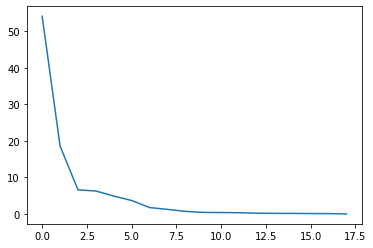

In [104]:
# the "cumulative variance explained" analysis 
tot = sum(eigenvalues)
var_exp = [( i /tot ) * 100 for i in sorted(eigenvalues, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)
plt.plot(var_exp)

We can observe that their is steep drop in variance explained with increase in number the number of Principal Components.
Also, top 10 principal components contribute 98% variance. so, 10 PCA components are chosen

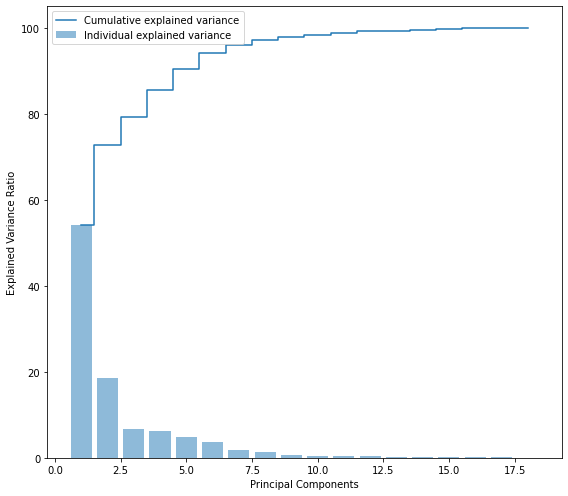

In [105]:
# Ploting 
plt.figure(figsize=(8 , 7))
plt.bar(range(1, eigenvalues.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, eigenvalues.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [107]:
# Reducing from 17 to 10 dimension space
from sklearn.decomposition import PCA
pca = PCA(n_components=10)
data_reduced = pca.fit_transform(X_z)
data_reduced.transpose()

array([[ 0.58422804, -1.5121798 ,  3.91344816, ...,  5.12009307,
        -3.29709502, -4.96759448],
       [-0.67567325, -0.34893367,  0.2345073 , ..., -0.18227007,
        -1.10194286,  0.42274968],
       [-0.45333356, -0.33343619, -1.26509352, ..., -0.50836783,
         1.93384417,  1.30871531],
       ...,
       [-0.68196902,  0.10442512,  0.17305277, ..., -0.38820845,
         0.45880709, -0.21433678],
       [ 0.31266966, -0.29625823,  0.19108534, ..., -0.07735512,
         0.82142229,  0.59676772],
       [ 0.14411602, -0.39097765, -0.52948668, ...,  0.55527162,
        -0.34059305,  0.10856429]])

In [108]:
pca.components_

array([[ 0.27250289,  0.28725469,  0.30242111,  0.26971354,  0.09786073,
         0.19520014,  0.31052393, -0.3090069 ,  0.307287  ,  0.27815416,
         0.29976509,  0.30553237,  0.26323762, -0.04193594,  0.03608321,
         0.05872048,  0.03801314,  0.08474   ],
       [-0.08704358,  0.13162176, -0.04614301, -0.19793126, -0.25783995,
        -0.10804563,  0.07528535, -0.01322994,  0.0875602 ,  0.12215424,
         0.07726575,  0.07150302,  0.21058205,  0.50362158, -0.01576632,
        -0.09274624, -0.50162122, -0.50761211],
       [-0.03818521, -0.20114691,  0.06346211,  0.05628517, -0.06199275,
        -0.14895782,  0.10904283, -0.09085269,  0.1060705 , -0.21368469,
         0.1445998 ,  0.11034374, -0.20287019,  0.07386402, -0.55917399,
         0.6706805 , -0.06224071, -0.04170535],
       [ 0.13867501, -0.03805548,  0.10895429, -0.25435509, -0.61276572,
         0.27867816,  0.00539295,  0.06521486,  0.03089915,  0.04146747,
        -0.06400509, -0.00219687, -0.08553965, -0.115

In [110]:
X_comp = pd.DataFrame(pca.components_,columns=list(X_z))
X_comp.head()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio
0,0.272503,0.287255,0.302421,0.269714,0.097861,0.195200,0.310524,-0.309007,0.307287,0.278154,0.299765,0.305532,0.263238,-0.041936,0.036083,0.058720,0.038013,0.084740
1,-0.087044,0.131622,-0.046143,-0.197931,-0.257840,-0.108046,0.075285,-0.013230,0.087560,0.122154,0.077266,0.071503,0.210582,0.503622,-0.015766,-0.092746,-0.501621,-0.507612
2,-0.038185,-0.201147,0.063462,0.056285,-0.061993,-0.148958,0.109043,-0.090853,0.106070,-0.213685,0.144600,0.110344,-0.202870,0.073864,-0.559174,0.670680,-0.062241,-0.041705
3,0.138675,-0.038055,0.108954,-0.254355,-0.612766,0.278678,0.005393,0.065215,0.030899,0.041467,-0.064005,-0.002197,-0.085540,-0.115400,0.473703,0.428426,-0.027410,0.096037
4,0.137101,-0.138996,-0.080017,0.133744,0.123601,-0.634893,0.085557,-0.079073,0.081646,-0.251113,0.147471,0.110101,-0.005212,0.138069,0.566552,0.130870,0.180519,-0.110788


In [111]:
# Reducing from 17 to 10 dimension space
N_reduce = np.array(eigenvectors[0:10])   
# projecting original data into principal component dimensions
X_std_10D = np.dot(X_z,N_reduce.T)   
# converting array to dataframe for pairplot
Proj_data_df = pd.DataFrame(X_std_10D)

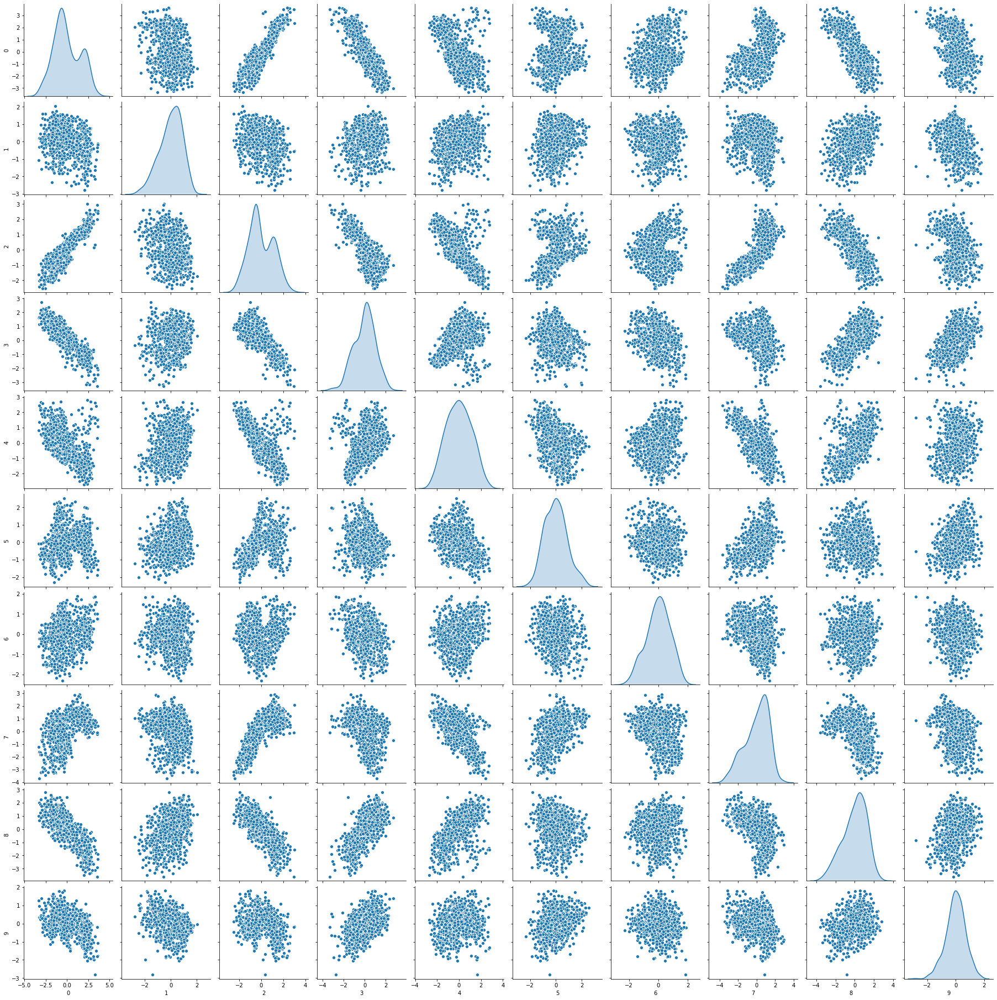

In [112]:
#Let us check it visually
sns.pairplot(Proj_data_df, diag_kind='kde')

In [113]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(Proj_data_df,y, test_size = 0.3, random_state = 10)

Model building

In [114]:
#Logistic regression
model = LogisticRegression()
model.fit(X_train, y_train)
prediction = model.predict(X_test)

In [116]:
# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ',model.score(X_test , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.8614864864864865
Accuracy on Testing data:  0.8543307086614174
Recall value:  0.863621175327829
Precision value:  0.8442223075975152
Confusion Matrix:
 [[ 60   9   2]
 [  9 104   3]
 [  2  12  53]]
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.85      0.85        71
           1       0.83      0.90      0.86       116
           2       0.91      0.79      0.85        67

    accuracy                           0.85       254
   macro avg       0.86      0.84      0.85       254
weighted avg       0.86      0.85      0.85       254



In [117]:
resultsDf=pd.DataFrame({'Model':['Logistic'],'Accuracy': model.score(X_test , y_test)},index={'1'})
resultsDf=resultsDf[['Model','Accuracy']]
resultsDf

,Model,Accuracy
1,Logistic,0.854331


In [118]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_train, y_train)
prediction = model.predict(X_test)

In [119]:
# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.6469594594594594
Accuracy on Testing data:  0.6417322834645669
Recall value:  0.6618565646754088
Precision value:  0.7433265993265993
Confusion Matrix:
 [[30  0  0]
 [16 79  4]
 [25 46 54]]
Classification Report:
               precision    recall  f1-score   support

           0       0.42      1.00      0.59        30
           1       0.63      0.80      0.71        99
           2       0.93      0.43      0.59       125

    accuracy                           0.64       254
   macro avg       0.66      0.74      0.63       254
weighted avg       0.75      0.64      0.64       254



In [120]:
#Store the accuracy results for each kernel in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Model':['Naive Bayes'], 'Accuracy': model.score(X_test, y_test)},index={'2'})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Model','Accuracy']]
resultsDf

,Model,Accuracy
1,Logistic,0.854331
2,Naive Bayes,0.641732


In [121]:
clf = SVC()
clf.fit(X_train, y_train)
prediction = model.predict(X_test)

In [122]:
# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.6469594594594594
Accuracy on Testing data:  0.6417322834645669
Recall value:  0.6618565646754088
Precision value:  0.7433265993265993
Confusion Matrix:
 [[30  0  0]
 [16 79  4]
 [25 46 54]]
Classification Report:
               precision    recall  f1-score   support

           0       0.42      1.00      0.59        30
           1       0.63      0.80      0.71        99
           2       0.93      0.43      0.59       125

    accuracy                           0.64       254
   macro avg       0.66      0.74      0.63       254
weighted avg       0.75      0.64      0.64       254



In [123]:
#Store the accuracy results for each kernel in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Model':['SVM'], 'Accuracy': model.score(X_test, y_test)},index={'4'})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Model','Accuracy']]
resultsDf

,Model,Accuracy
1,Logistic,0.854331
2,Naive Bayes,0.641732
4,SVM,0.641732


The accuracy, precision and recall value is reduced after applying PCA because we have reduced the dimensions.
Despite giving less accuracy, precision and recall, this model is better as it has taken into consideration the relationship between the independent varibales and reduced the columns which are highly correlated.